##Setup

You will need to make a copy of this notebook in your Google Drive before you can edit the homework files. You can do so with **File &rarr; Save a copy in Drive**. Please run on GPU: Runtime -> Change runtime type -> Hardware accelerator -> T4 GPU

In [1]:
#@title mount your Google Drive
#@markdown Your work will be stored in a folder called `hw_16831` by default to prevent Colab instance timeouts from deleting your edits.

import os
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#@title set up mount symlink

DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/hw_16831'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

<>:3: SyntaxWarning: invalid escape sequence '\ '
<>:3: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-3425321108.py:3: SyntaxWarning: invalid escape sequence '\ '
  DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'


In [3]:
#@title apt install requirements

#@markdown Run each section with Shift+Enter

#@markdown Double-click on section headers to show code.

!apt update
!apt install -y --no-install-recommends \
        build-essential \
        curl \
        git \
        gnupg2 \
        make \
        cmake \
        ffmpeg \
        swig \
        libz-dev \
        unzip \
        zlib1g-dev \
        libglfw3 \
        libglfw3-dev \
        libxrandr2 \
        libxinerama-dev \
        libxi6 \
        libxcursor-dev \
        libgl1-mesa-dev \
        libgl1-mesa-glx \
        libglew-dev \
        libosmesa6-dev \
        lsb-release \
        ack-grep \
        patchelf \
        wget \
        xpra \
        xserver-xorg-dev \
        xvfb \
        python3-opengl \
        ffmpeg

Hit:1 https://cli.github.com/packages stable InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [9,280 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/multiverse amd64 Packages [71.0 kB]
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,798 kB]
Get:14 ht

In [4]:
#@title clone homework repo

# if free-mujoco-py version error appears, run next two cells

%cd $SYM_PATH
!git clone https://github.com/LeCAR-Lab/16831-F25-HW.git
%cd 16831-F25-HW/hw1
%pip install -r requirements.txt
%pip install -e .

/content/gdrive/My Drive/hw_16831
fatal: destination path '16831-F25-HW' already exists and is not an empty directory.
/content/gdrive/My Drive/hw_16831/16831-F25-HW/hw1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.3/140.3 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
ERROR: Ignored the following versions that require a different python version: 2.1.4 Requires-Python >=3.7.1,<3.11; 2.1.6 Requires-Python >=3.7.1,<3.11; 2.1.6.dev0 Requires-Python >=3.7.1,<3.11
ERROR: Could not find a version that satisfies the requirement free-mujoco-py (from versions: none)
ERROR: No matching distribution found for free-mujoco-py
Obtaining file:///content/gdrive/My%20Drive/hw_16831/16831-F25-HW/hw1
  Preparing metadata (setup.py) ... done
  Running setup.py develop for rob831


In [5]:
# downloads mujoco from source
!wget https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
!tar xzvf mujoco210-linux-x86_64.tar.gz
!mkdir -p ~/.mujoco
!mv mujoco210 ~/.mujoco/mujoco210
!rm mujoco*

%pip install -U mujoco
%pip install -U 'mujoco-py<2.2,>=2.1'
%pip install -U pyvirtualdisplay
%pip install -U gym-notebook-wrapper
%pip install -U "cython<3"

!cp /root/.mujoco/mujoco210/bin/*.so /usr/lib/x86_64-linux-gnu/

--2025-09-17 19:25:24--  https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
Resolving mujoco.org (mujoco.org)... 216.239.34.21, 216.239.38.21, 216.239.32.21, ...
Connecting to mujoco.org (mujoco.org)|216.239.34.21|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz [following]
--2025-09-17 19:25:24--  https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/400501136/1f51148e-4e64-4a12-a400-d6f1e21be444?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-17T20%3A24%3A52Z&rscd=attachment%3B+filename%3Dmujoco210-linux-x86_64.tar.gz&rsct=application%2Foctet-stream&s

In [6]:
# set env variables
import os
os.environ['LD_LIBRARY_PATH'] += ':/root/.mujoco/mujoco210/bin'
os.environ['MUJOCO_PY_MUJOCO_PATH'] = '/root/.mujoco/mujoco210'
os.environ['LD_LIBRARY_PATH'] += ':/usr/lib/nvidia'

In [ ]:
#@title set up virtual display

from pyvirtualdisplay import Display

display = Display(visible=0, size=(1400, 900))
display.start()

In [ ]:
#@title test virtual display

#@markdown If you see a video of a four-legged ant fumbling about, setup is complete!
import numpy as np
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_
import gym
import gnwrapper

env = gnwrapper.LoopAnimation(gym.make('Ant-v2'))

observation = env.reset()
for i in range(100):
    obs, rew, term, _ = env.step(env.action_space.sample())
    env.render()
    if term:
      break

env.display()
env.close()

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment Ant-v2 is out of date. You should consider upgrading to version `v4`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/Cython/Distutils/old_build_ext.py:15: DeprecationWarning: dep_util is Deprecated. Use functions from setuptools instead.
  from distutils.dep_util import newer, newer_group
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UT

Compiling /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx because it depends on /usr/local/lib/python3.12/dist-packages/Cython/Includes/cpython/object.pxd.
[1/1] Cythonizing /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx


INFO:root:running build_ext
INFO:root:building 'mujoco_py.cymj' extension
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py/gl
INFO:root:x86_64-linux-gnu-gcc -fno-strict-overflow -Wsign-compare -DNDEBUG -g -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.12/dist-packages/mujoco_py -I/root/.mujoco/mujoco210/include -I/usr/local/lib/python3.12/dist-packages/numpy/_core/include -I/usr/include/python3.12 -c /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.c -o /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/t

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Editing Code

To edit code, click the folder icon on the left menu. Navigate to the corresponding file (`hw_16831/...`). Double click a file to open an editor. There is a timeout of about ~12 hours with Colab while it is active (and less if you close your browser window). We sync your edits to Google Drive so that you won't lose your work in the event of an instance timeout, but you will need to re-mount your Google Drive and re-install packages with every new instance.

In [7]:
import importlib
!pip install tensorboardX
import rob831.policies.MLP_policy
import rob831.agents.bc_agent
import rob831.infrastructure.rl_trainer
import rob831.infrastructure.utils

importlib.reload(rob831.policies.MLP_policy)
importlib.reload(rob831.agents.bc_agent)
importlib.reload(rob831.infrastructure.rl_trainer)
importlib.reload(rob831.infrastructure.utils)

from rob831.infrastructure.rl_trainer import RL_Trainer
from rob831.agents.bc_agent import BCAgent
from rob831.policies.loaded_gaussian_policy import LoadedGaussianPolicy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.7 MB/s eta 0:00:00


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=

In [8]:
#@title imports
import numpy as np
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_
import os
import time

from rob831.infrastructure.rl_trainer import RL_Trainer
from rob831.agents.bc_agent import BCAgent
from rob831.policies.loaded_gaussian_policy import LoadedGaussianPolicy

#%load_ext autoreload
# %autoreload 2

## Run Behavior Cloning (Problem 1)

In [28]:
#@title runtime arguments

class Args:

  def __getitem__(self, key):
    return getattr(self, key)

  def __setitem__(self, key, val):
    setattr(self, key, val)

  #@markdown expert data
  expert_policy_file = 'rob831/policies/experts/Hopper.pkl' #@param
  expert_data = 'rob831/expert_data/expert_data_Hopper-v2.pkl' #@param
  env_name = 'Hopper-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
  exp_name = 'test_bc_hopper' #@param
  do_dagger = False #@param {type: "boolean"}
  ep_len = 1000 #@param {type: "integer"}
  save_params = False #@param {type: "boolean"}

  num_agent_train_steps_per_iter = 2500 #@param {type: "integer"})
  n_iter = 1 #@param {type: "integer"})

  #@markdown batches & buffers
  batch_size = 1000 #@param {type: "integer"})
  eval_batch_size = 5000 #@param {type: "integer"}
  train_batch_size = 100 #@param {type: "integer"}
  max_replay_buffer_size = 1000000 #@param {type: "integer"}

  #@markdown network
  n_layers = 5 #@param {type: "integer"}
  size = 64 #@param {type: "integer"}
  learning_rate = 4e-3 #@param {type: "number"}

  #@markdown logging
  video_log_freq = -1 #@param {type: "integer"}
  scalar_log_freq = 1 #@param {type: "integer"}

  #@markdown gpu & run-time settings
  no_gpu = False #@param {type: "boolean"}
  which_gpu = 0 #@param {type: "integer"}
  seed = 1 #@param {type: "integer"}

args = Args()


In [29]:
#@title define `BC_Trainer`
class BC_Trainer(object):

    def __init__(self, params):
        #######################
        ## AGENT PARAMS
        #######################

        agent_params = {
            'n_layers': params['n_layers'],
            'size': params['size'],
            'learning_rate': params['learning_rate'],
            'max_replay_buffer_size': params['max_replay_buffer_size'],
            }

        self.params = params
        self.params['agent_class'] = BCAgent ## TODO: look in here and implement this
        self.params['agent_params'] = agent_params

        ################
        ## RL TRAINER
        ################

        self.rl_trainer = RL_Trainer(self.params) ## TODO: look in here and implement this

        #######################
        ## LOAD EXPERT POLICY
        #######################

        print('Loading expert policy from...', self.params['expert_policy_file'])
        self.loaded_expert_policy = LoadedGaussianPolicy(self.params['expert_policy_file'])
        print('Done restoring expert policy...')

    def run_training_loop(self):

        self.rl_trainer.run_training_loop(
            n_iter=self.params['n_iter'],
            initial_expertdata=self.params['expert_data'],
            collect_policy=self.rl_trainer.agent.actor,
            eval_policy=self.rl_trainer.agent.actor,
            relabel_with_expert=self.params['do_dagger'],
            expert_policy=self.loaded_expert_policy,
        )


In [30]:
#@title create directory for logging

if args.do_dagger:
    logdir_prefix = 'q2_'
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

data_path ='/content/hw_16831/hw1/data'
if not (os.path.exists(data_path)):
    os.makedirs(data_path)
logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [31]:
# Make sure you're in the 16831-F25-HW/hw1 folder when running this.
## run training
print(args.logdir)
trainer = BC_Trainer(args)
trainer.run_training_loop()

/content/hw_16831/hw1/data/q1_test_bc_hopper_Hopper-v2_17-09-2025_19-53-07
########################
logging outputs to  /content/hw_16831/hw1/data/q1_test_bc_hopper_Hopper-v2_17-09-2025_19-53-07
########################
Using GPU id 0
Loading expert policy from... rob831/policies/experts/Hopper.pkl


/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment Hopper-v2 is out of date. You should consider upgrading to version `v4`.
  logger.warn(


obs (1, 11) (1, 11)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 792.6358032226562
Eval_StdReturn : 285.9510803222656
Eval_MaxReturn : 1515.6312255859375
Eval_MinReturn : 391.61199951171875
Eval_AverageEpLen : 253.55
Train_AverageReturn : 3772.67041015625
Train_StdReturn : 1.9483642578125
Train_MaxReturn : 3774.61865234375
Train_MinReturn : 3770.721923828125
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 11.917787075042725
Training_Loss : 0.015345176681876183
Initial_DataCollection_AverageReturn : 3772.67041015625
Done logging...




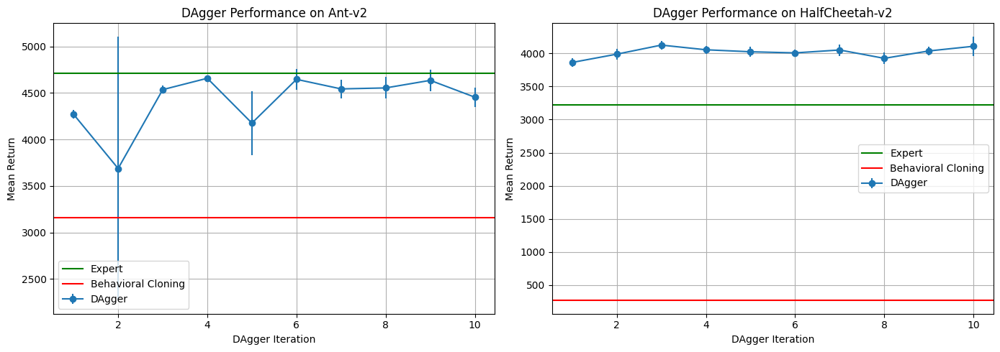

In [ ]:
# Code to create dagger vs expert vs bc plot for ant and another environment
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing import event_accumulator
def load_dagger_results(events_file, mean_tag='Eval_AverageReturn', std_tag='Eval_StdReturn'):
    ea = event_accumulator.EventAccumulator(events_file)
    ea.Reload()

    events_mean = ea.Scalars(mean_tag)
    events_std = ea.Scalars(std_tag)

    iterations = []
    mean_returns = []
    std_returns = []

    for i, (mean_event, std_event) in enumerate(zip(events_mean, events_std)):
        iterations.append(i + 1)
        mean_returns.append(mean_event.value)
        std_returns.append(std_event.value)

    return np.array(iterations), np.array(mean_returns), np.array(std_returns)

# set file paths for dagger runs
ant_events_file = "/content/hw_16831/hw1/data/dagger_ant_best/events.out.tfevents.1757960956.fa6d327748f6"
humanoid_events_file = "/content/hw_16831/hw1/data/q2_test_bc_halfcheetah_HalfCheetah-v2_15-09-2025_19-22-47/events.out.tfevents.1757964176.fa6d327748f6"  # replace with your Humanoid file
ant_iters, ant_mean, ant_std = load_dagger_results(ant_events_file)
humanoid_iters, humanoid_mean, humanoid_std = load_dagger_results(humanoid_events_file)

# manually fill in results of the two environments based on results from the earlier question
expert_ant = 4713.65
bc_ant = 3161.85
expert_humanoid = 3227.67   # fill in
bc_humanoid = 264.75       # fill in

# Plotting
plt.figure(figsize=(14,5))

# Ant-v2 plot
plt.subplot(1,2,1)
plt.errorbar(ant_iters, ant_mean, yerr=ant_std, fmt='-o', label='DAgger')
plt.axhline(y=expert_ant, color='g', label='Expert')
plt.axhline(y=bc_ant, color='r', label='Behavioral Cloning')
plt.xlabel('DAgger Iteration')
plt.ylabel('Mean Return')
plt.title('DAgger Performance on Ant-v2')
plt.grid(True)
plt.legend()

# Humanoid-v2 plot
plt.subplot(1,2,2)
plt.errorbar(humanoid_iters, humanoid_mean, yerr=humanoid_std, fmt='-o', label='DAgger')
plt.axhline(y=expert_humanoid, color='g', label='Expert')
plt.axhline(y=bc_humanoid, color='r', label='Behavioral Cloning')
plt.xlabel('DAgger Iteration')
plt.ylabel('Mean Return')
plt.title('DAgger Performance on HalfCheetah-v2')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.savefig("/content/hw_16831/hw1/data/dagger_vs_bc_vs_expert.png", dpi=300)
plt.show()

In [ ]:
# code to run bc train multiple times with different parameter
params = {'num_agent_train_steps_per_iter': list(range(1000, 5000+1, 500))}

for param in params:
  for rollout in params[param]:
    setattr(args, param, rollout)
    logdir = f'/content/hw_16831/hw1/Ant2_{param}'
    if not(os.path.exists(logdir)):
      os.makedirs(logdir)
    output_dir = os.path.join(logdir, f'{rollout}')
    args['logdir'] = output_dir
    trainer = BC_Trainer(args)
    trainer.run_training_loop()





########################
logging outputs to  /content/hw_16831/hw1/Ant2_num_agent_train_steps_per_iter/1000
########################
Using GPU id 0
Loading expert policy from... rob831/policies/experts/Ant.pkl
obs (1, 111) (1, 111)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 1232.541259765625
Eval_StdReturn : 280.1985778808594
Eval_MaxReturn : 1665.207763671875
Eval_MinReturn : 874.89306640625
Eval_AverageEpLen : 991.5
Train_AverageReturn : 4713.6533203125
Train_StdReturn : 12.196533203125
Train_MaxReturn : 4725.849609375
Train_MinReturn : 4701.45654296875
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 10.80554986000061
Training_Loss : 0.048094362020492554
Initial_DataCollection_AverageReturn : 4713.6533203125
Done logging...


########################
logging outputs to  /content/hw_16831/hw1/Ant2_num_agent_train_steps_per_iter/

{'1000': {'Eval_AverageReturn': 1232.541259765625, 'Eval_StdReturn': 280.1985778808594, 'Eval_MaxReturn': 1665.207763671875, 'Eval_MinReturn': 874.89306640625, 'Eval_AverageEpLen': 991.5, 'Train_AverageReturn': 4713.6533203125, 'Train_StdReturn': 12.196533203125, 'Train_MaxReturn': 4725.849609375, 'Train_MinReturn': 4701.45654296875, 'Train_AverageEpLen': 1000.0, 'Train_EnvstepsSoFar': 0.0, 'TimeSinceStart': 10.805549621582031, 'Training_Loss': 0.048094362020492554, 'Initial_DataCollection_AverageReturn': 4713.6533203125}, '1500': {'Eval_AverageReturn': 713.7720947265625, 'Eval_StdReturn': 104.62715911865234, 'Eval_MaxReturn': 870.373046875, 'Eval_MinReturn': 619.5807495117188, 'Eval_AverageEpLen': 1000.0, 'Train_AverageReturn': 4713.6533203125, 'Train_StdReturn': 12.196533203125, 'Train_MaxReturn': 4725.849609375, 'Train_MinReturn': 4701.45654296875, 'Train_AverageEpLen': 1000.0, 'Train_EnvstepsSoFar': 0.0, 'TimeSinceStart': 11.766491889953613, 'Training_Loss': 0.026329096406698227, '

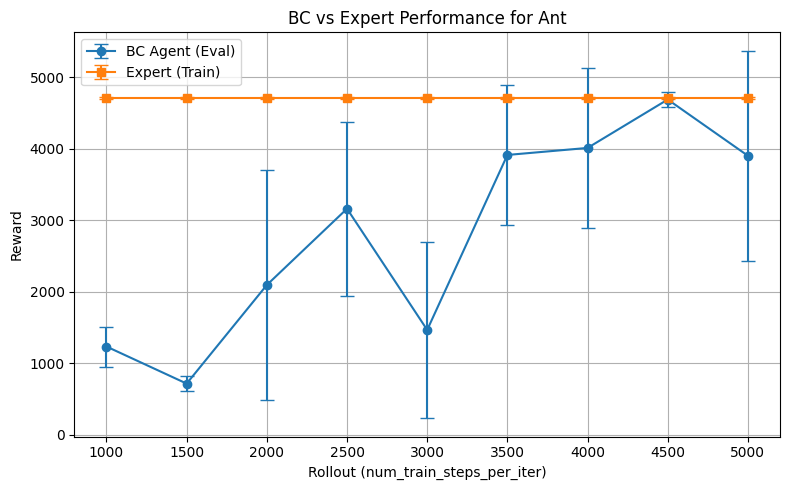

In [ ]:
# plot the multiple runs with different parameter
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

def parse_tfevents_final(path):
    event_acc = EventAccumulator(path)
    event_acc.Reload()

    result = {}
    for tag in event_acc.Tags()['scalars']:
        scalars = event_acc.Scalars(tag)
        if scalars:
            result[tag] = scalars[-1].value  # last value only
    return result

path = '/content/hw_16831/hw1/Ant2_num_agent_train_steps_per_iter'
folders = [
    f for f in os.listdir(path)
    if os.path.isdir(os.path.join(path, f)) and f.isdigit()
]

folders = sorted(folders, key=lambda x: int(x))
results = {}
for rollout in folders:
    rollout_path = os.path.join(path, rollout)

    # find the event file inside this rollout folder
    event_files = [f for f in os.listdir(rollout_path) if f.startswith("events.out.tfevents")]
    if not event_files:
        continue

    event_file = os.path.join(rollout_path, event_files[0])

    result_dict = parse_tfevents_final(event_file)
    results[rollout] = result_dict

print(results)
rollouts = sorted([int(k) for k in results.keys()])
bc_avg = [results[str(r)]['Eval_AverageReturn'] for r in rollouts]
bc_std = [results[str(r)]['Eval_StdReturn'] for r in rollouts]
expert_avg = [results[str(r)]['Train_AverageReturn'] for r in rollouts]
expert_std = [results[str(r)]['Train_StdReturn'] for r in rollouts]

plt.figure(figsize=(8, 5))
plt.errorbar(rollouts, bc_avg, yerr=bc_std, fmt='-o', capsize=5, label='BC Agent (Eval)')
plt.errorbar(rollouts, expert_avg, yerr=expert_std, fmt='-s', capsize=5, label='Expert (Train)')

plt.xlabel('Rollout (num_train_steps_per_iter)')
plt.ylabel('Reward')
plt.title('BC vs Expert Performance for Ant')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/hw_16831/hw1/Ant2_num_agent_train_steps_per_iter/bc_vs_expert_ant.png", dpi=300)
plt.show()


In [ ]:
#@markdown You can visualize your runs with tensorboard from within the notebook
from tensorboard import notebook
notebook.list()
%reload_ext tensorboard
%tensorboard --logdir /content/hw_16831/hw1/data

No known TensorBoard instances running.


<IPython.core.display.Javascript object>

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Running DAgger (Problem 2)
Modify the settings above:
1. check the `do_dagger` box
2. set `n_iters` to `10`
and then rerun the code.

In [ ]:
import shutil
# remove all folders in data folder
folder_to_clear = '/content/hw_16831/hw1/old_data'
# Check if folder exists
if os.path.exists(folder_to_clear):
    # Remove everything inside the folder
    for filename in os.listdir(folder_to_clear):
        file_path = os.path.join(folder_to_clear, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)  # remove file or symlink
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)  # remove folder and contents
        except Exception as e:
            print(f'Failed to delete {file_path}. Reason: {e}')
else:
    print(f"Folder {folder_to_clear} does not exist.")